# Generating New MNIST Digits with a GAN

<div style="background-color: #f0f8ff; border: 2px solid #4682b4; padding: 10px;">
<a href="https://colab.research.google.com/github/DeepTrackAI/DeepLearningCrashCourse/blob/main/Ch09_GAN/ec09_1_gan_mnist/gan_mnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
<strong>If using Colab/Kaggle:</strong> You need to uncomment the code in the cell below this one.
</div>

In [1]:
!pip install deeplay  # Uncomment if using Colab/Kaggle.

This notebook provides you with a complete code example to generate MNIST digits with a GAN.

<div style="background-color: #f0f8ff; border: 2px solid #4682b4; padding: 10px;">
<strong>Note:</strong> This notebook contains the Code Example 9-1 from the book  

**Deep Learning Crash Course**  
Giovanni Volpe, Benjamin Midtvedt, Jesús Pineda, Henrik Klein Moberg, Harshith Bachimanchi, Joana B. Pereira, Carlo Manzo  
No Starch Press, San Francisco (CA), 2026  
ISBN-13: 9781718503922  

[https://nostarch.com/deep-learning-crash-course](https://nostarch.com/deep-learning-crash-course)

You can find the other notebooks on the [Deep Learning Crash Course GitHub page](https://github.com/DeepTrackAI/DeepLearningCrashCourse).
</div>

## Loading the MNIST Dataset with PyTorch

Implement the digit transformations ...

In [2]:
from torchvision.transforms import Compose, Normalize, Resize, ToTensor

transform = Compose([Resize((64, 64)), ToTensor(),
                     Normalize(mean=[0.5], std=[0.5], inplace=True)])

... import the MNIST digits ...

In [3]:
from torchvision.datasets import MNIST

trainset = MNIST(root="data", train=True, transform=transform, download=True)

... and plot some of the transformed MNIST digits.

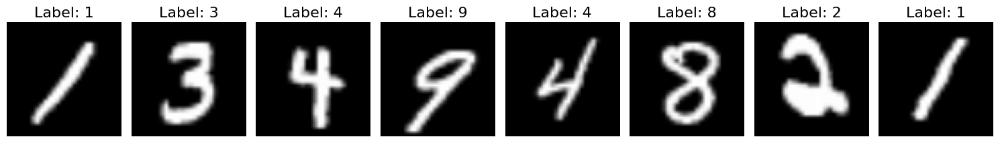

In [ ]:
import torch
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 8, figsize=(15, 3))
for ax in axs.ravel():
    img, label = trainset[torch.randint(0, len(trainset), (1,)).squeeze()]
    ax.imshow(img.squeeze(), cmap="gray")
    ax.set_title(f"Label: {label}", fontsize=16)
    ax.axis("off")
plt.tight_layout()
plt.show()

## Defining the Generator and Discriminator

Determine the device to be used in the computations ...

In [5]:
def get_device():
    """Select device where to perform the computations."""
    if torch.cuda.is_available():
        return torch.device("cuda:0")
    elif torch.backends.mps.is_available():
        return torch.device("mps")
    else:
        return torch.device("cpu")

device = get_device()

print(f"Selected device: {device}")

Selected device: mps


... instantiate the generator ...

In [6]:
import deeplay as dl

latent_dim = 100

gen = dl.DCGANGenerator(
    latent_dim=latent_dim, features_dim=64, output_channels=1,
).build().to(device)

... and instantiate the discriminator.

In [7]:
disc = dl.DCGANDiscriminator(
    input_channels=1, features_dim=64,
).build().to(device)

## Training the GAN

Define the data loader ...

In [8]:
loader = dl.DataLoader(trainset, batch_size=128, shuffle=True)

... define the loss function ...

In [9]:
loss = torch.nn.BCELoss()

... define the optimizers ...

In [10]:
optim_gen = torch.optim.Adam(gen.parameters(), lr=0.0002, betas=(0.5, 0.999))
optim_disc = torch.optim.Adam(disc.parameters(), lr=0.0002, betas=(0.5, 0.999))

... implement the adversarial training ...


Epoch 1/20
----------
Batch 1/469: Generator Loss: 0.8325, Discriminator Loss: 0.6955
Batch 101/469: Generator Loss: 3.6256, Discriminator Loss: 0.0313
Batch 201/469: Generator Loss: 0.5989, Discriminator Loss: 0.7190
Batch 301/469: Generator Loss: 0.7482, Discriminator Loss: 0.6208
Batch 401/469: Generator Loss: 0.8674, Discriminator Loss: 0.6314
----------
Epoch 1/20: Generator Loss: 1.5426, Discriminator Loss: 0.4898, Time taken: 0:04:02.649604


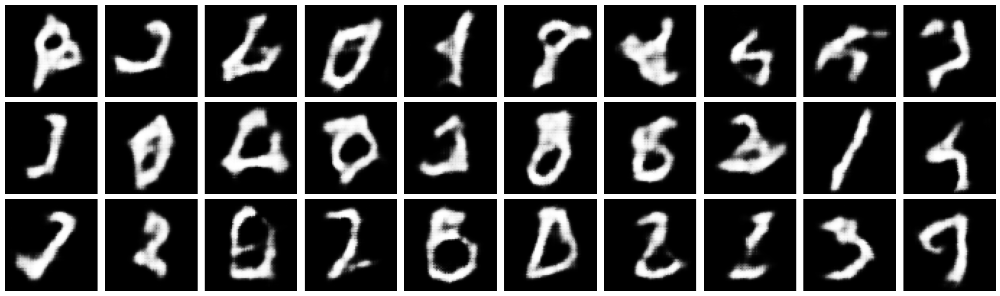


Epoch 2/20
----------
Batch 1/469: Generator Loss: 0.9211, Discriminator Loss: 0.7648
Batch 101/469: Generator Loss: 1.0697, Discriminator Loss: 0.6300
Batch 201/469: Generator Loss: 0.7736, Discriminator Loss: 0.6644
Batch 301/469: Generator Loss: 0.9057, Discriminator Loss: 0.5827
Batch 401/469: Generator Loss: 0.9296, Discriminator Loss: 0.5476
----------
Epoch 2/20: Generator Loss: 0.9562, Discriminator Loss: 0.6136, Time taken: 0:04:00.395999


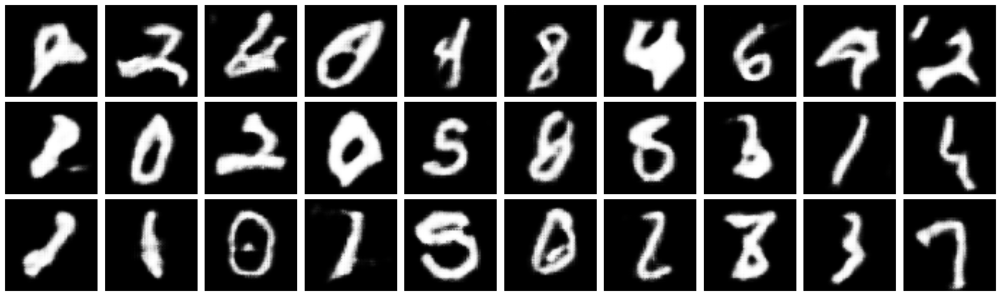


Epoch 3/20
----------
Batch 1/469: Generator Loss: 1.0866, Discriminator Loss: 0.5041
Batch 101/469: Generator Loss: 1.3401, Discriminator Loss: 0.4605
Batch 201/469: Generator Loss: 0.9708, Discriminator Loss: 0.4950
Batch 301/469: Generator Loss: 2.7304, Discriminator Loss: 0.1729
Batch 401/469: Generator Loss: 2.4588, Discriminator Loss: 0.1993
----------
Epoch 3/20: Generator Loss: 1.8252, Discriminator Loss: 0.3818, Time taken: 0:03:59.578583


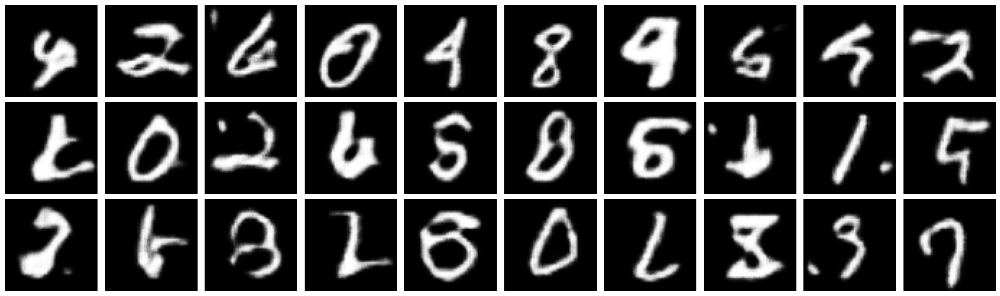


Epoch 4/20
----------
Batch 1/469: Generator Loss: 2.5742, Discriminator Loss: 0.1219
Batch 101/469: Generator Loss: 2.3232, Discriminator Loss: 0.1566
Batch 201/469: Generator Loss: 0.9879, Discriminator Loss: 3.0055
Batch 301/469: Generator Loss: 2.9218, Discriminator Loss: 0.0785
Batch 401/469: Generator Loss: 3.0521, Discriminator Loss: 0.0591
----------
Epoch 4/20: Generator Loss: 2.9018, Discriminator Loss: 0.1850, Time taken: 0:04:04.411420


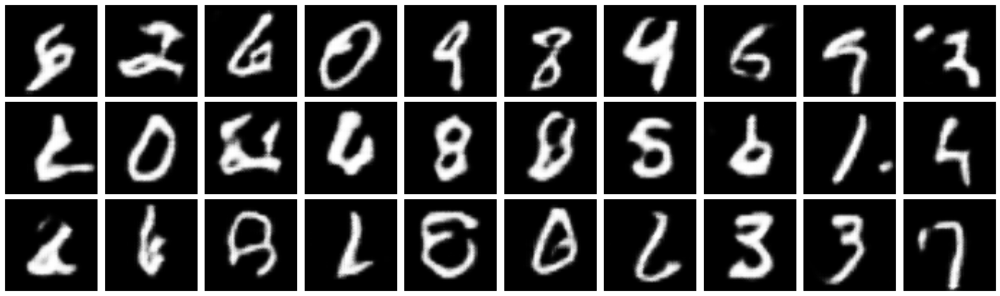


Epoch 5/20
----------
Batch 1/469: Generator Loss: 3.3090, Discriminator Loss: 0.0500
Batch 101/469: Generator Loss: 1.4773, Discriminator Loss: 0.6013
Batch 201/469: Generator Loss: 1.4278, Discriminator Loss: 0.3193
Batch 301/469: Generator Loss: 1.6345, Discriminator Loss: 0.2739
Batch 401/469: Generator Loss: 3.4335, Discriminator Loss: 0.0442
----------
Epoch 5/20: Generator Loss: 3.0566, Discriminator Loss: 0.2017, Time taken: 0:04:02.666935


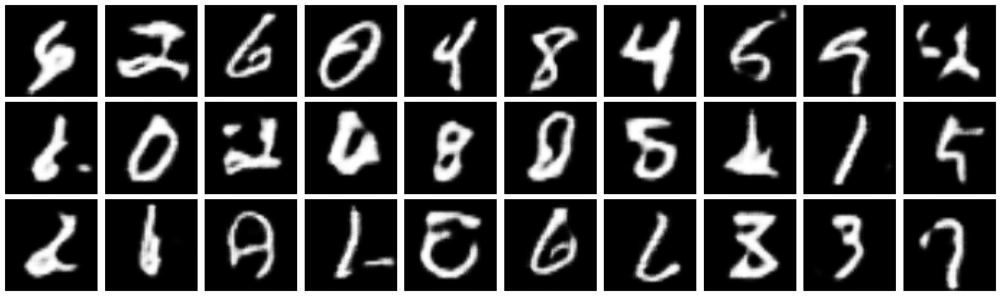


Epoch 6/20
----------
Batch 1/469: Generator Loss: 4.1651, Discriminator Loss: 0.0247
Batch 101/469: Generator Loss: 4.0623, Discriminator Loss: 0.0218
Batch 201/469: Generator Loss: 1.3673, Discriminator Loss: 0.4767
Batch 301/469: Generator Loss: 1.3643, Discriminator Loss: 0.2769
Batch 401/469: Generator Loss: 3.4330, Discriminator Loss: 0.0620
----------
Epoch 6/20: Generator Loss: 3.1456, Discriminator Loss: 0.2042, Time taken: 0:03:59.926624


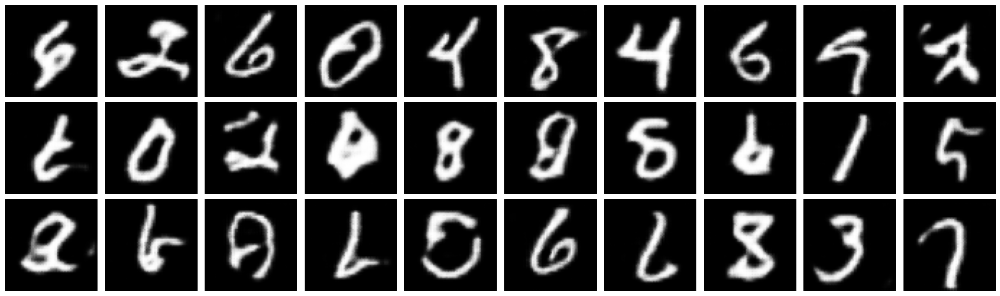


Epoch 7/20
----------
Batch 1/469: Generator Loss: 3.9917, Discriminator Loss: 0.0242
Batch 101/469: Generator Loss: 4.6758, Discriminator Loss: 0.0098
Batch 201/469: Generator Loss: 1.2852, Discriminator Loss: 0.4199
Batch 301/469: Generator Loss: 2.8216, Discriminator Loss: 0.2540
Batch 401/469: Generator Loss: 4.4365, Discriminator Loss: 0.2027
----------
Epoch 7/20: Generator Loss: 3.3210, Discriminator Loss: 0.1946, Time taken: 0:04:00.216319


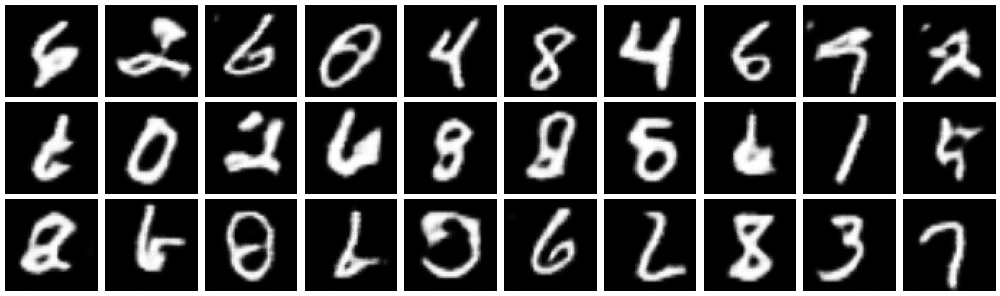


Epoch 8/20
----------
Batch 1/469: Generator Loss: 3.9867, Discriminator Loss: 0.0228
Batch 101/469: Generator Loss: 5.7854, Discriminator Loss: 0.0100
Batch 201/469: Generator Loss: 5.2405, Discriminator Loss: 0.0090
Batch 301/469: Generator Loss: 5.3429, Discriminator Loss: 0.0076
Batch 401/469: Generator Loss: 4.9093, Discriminator Loss: 0.0097
----------
Epoch 8/20: Generator Loss: 4.8939, Discriminator Loss: 0.0140, Time taken: 0:03:56.183140


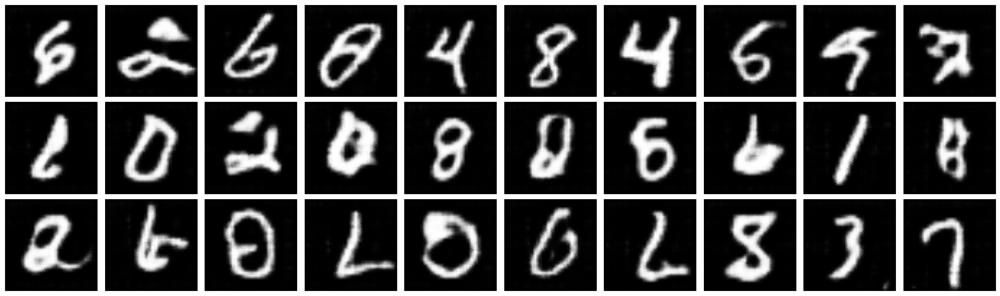


Epoch 9/20
----------
Batch 1/469: Generator Loss: 5.3883, Discriminator Loss: 0.0083
Batch 101/469: Generator Loss: 5.6184, Discriminator Loss: 0.0056
Batch 201/469: Generator Loss: 5.0736, Discriminator Loss: 0.0094
Batch 301/469: Generator Loss: 5.5607, Discriminator Loss: 0.0065
Batch 401/469: Generator Loss: 2.4455, Discriminator Loss: 0.3223
----------
Epoch 9/20: Generator Loss: 4.4492, Discriminator Loss: 0.1304, Time taken: 0:03:53.336594


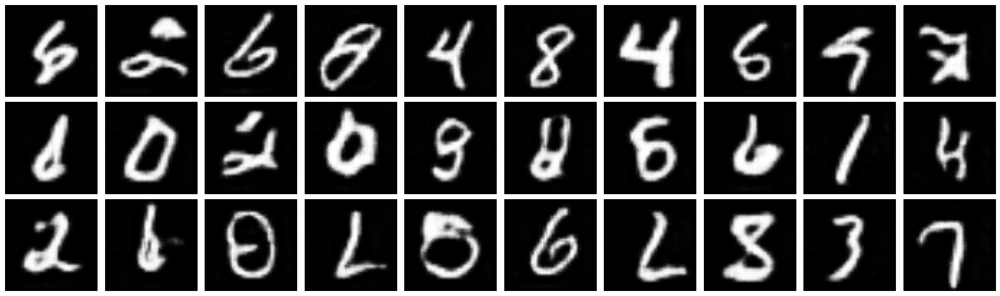


Epoch 10/20
----------
Batch 1/469: Generator Loss: 0.5259, Discriminator Loss: 1.3360
Batch 101/469: Generator Loss: 2.1927, Discriminator Loss: 0.1901
Batch 201/469: Generator Loss: 3.0689, Discriminator Loss: 0.1046
Batch 301/469: Generator Loss: 4.1876, Discriminator Loss: 0.0283
Batch 401/469: Generator Loss: 4.7223, Discriminator Loss: 0.0159
----------
Epoch 10/20: Generator Loss: 3.2021, Discriminator Loss: 0.2283, Time taken: 0:03:53.535491


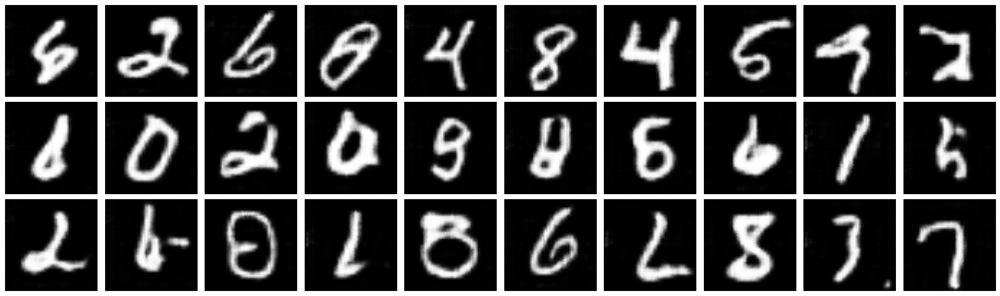


Epoch 11/20
----------
Batch 1/469: Generator Loss: 1.5783, Discriminator Loss: 0.2498
Batch 101/469: Generator Loss: 3.0057, Discriminator Loss: 0.1007
Batch 201/469: Generator Loss: 4.3843, Discriminator Loss: 0.0226
Batch 301/469: Generator Loss: 5.0688, Discriminator Loss: 0.0111
Batch 401/469: Generator Loss: 5.2459, Discriminator Loss: 0.0101
----------
Epoch 11/20: Generator Loss: 4.3177, Discriminator Loss: 0.0660, Time taken: 0:03:54.056032


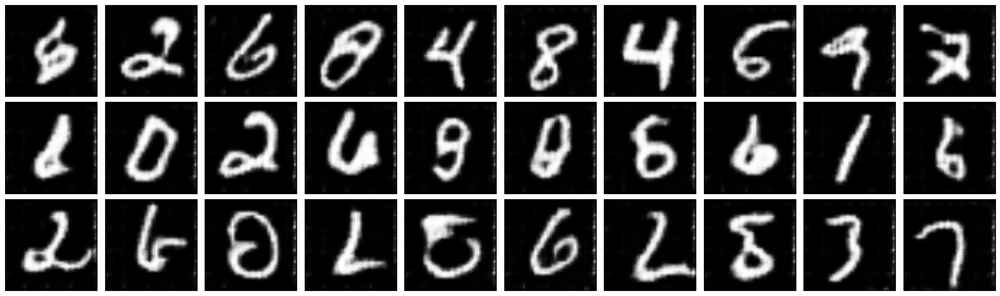


Epoch 12/20
----------
Batch 1/469: Generator Loss: 5.0236, Discriminator Loss: 0.0139
Batch 101/469: Generator Loss: 6.2302, Discriminator Loss: 0.0026
Batch 201/469: Generator Loss: 5.5251, Discriminator Loss: 0.0051
Batch 301/469: Generator Loss: 2.4124, Discriminator Loss: 0.2482
Batch 401/469: Generator Loss: 2.8873, Discriminator Loss: 0.1894
----------
Epoch 12/20: Generator Loss: 4.4280, Discriminator Loss: 0.1293, Time taken: 0:03:53.378613


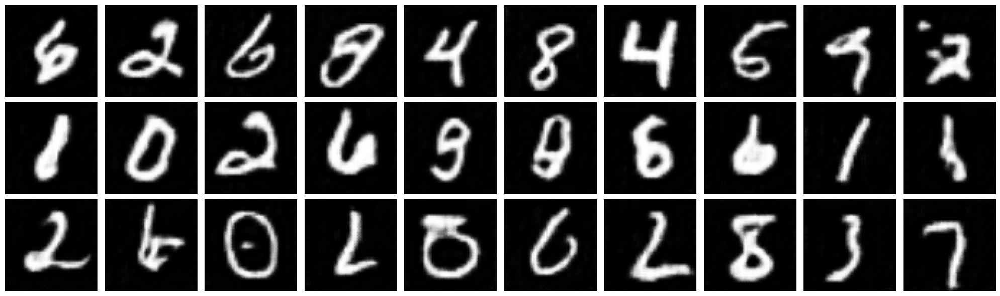


Epoch 13/20
----------
Batch 1/469: Generator Loss: 3.2816, Discriminator Loss: 0.1039
Batch 101/469: Generator Loss: 1.7503, Discriminator Loss: 0.3788
Batch 201/469: Generator Loss: 4.5564, Discriminator Loss: 0.0229
Batch 301/469: Generator Loss: 4.9791, Discriminator Loss: 0.0173
Batch 401/469: Generator Loss: 5.2770, Discriminator Loss: 0.0089
----------
Epoch 13/20: Generator Loss: 4.5290, Discriminator Loss: 0.0632, Time taken: 0:03:53.508981


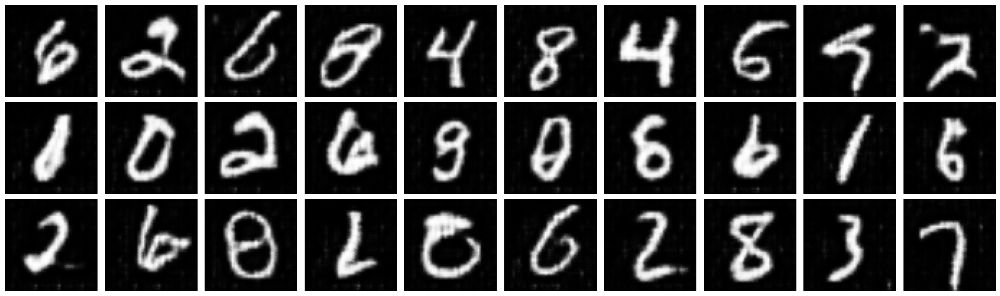


Epoch 14/20
----------
Batch 1/469: Generator Loss: 5.4976, Discriminator Loss: 0.0079
Batch 101/469: Generator Loss: 5.8571, Discriminator Loss: 0.0042
Batch 201/469: Generator Loss: 5.4972, Discriminator Loss: 0.0070
Batch 301/469: Generator Loss: 6.3508, Discriminator Loss: 0.0038
Batch 401/469: Generator Loss: 1.1959, Discriminator Loss: 0.4328
----------
Epoch 14/20: Generator Loss: 4.8395, Discriminator Loss: 0.1477, Time taken: 0:03:54.512396


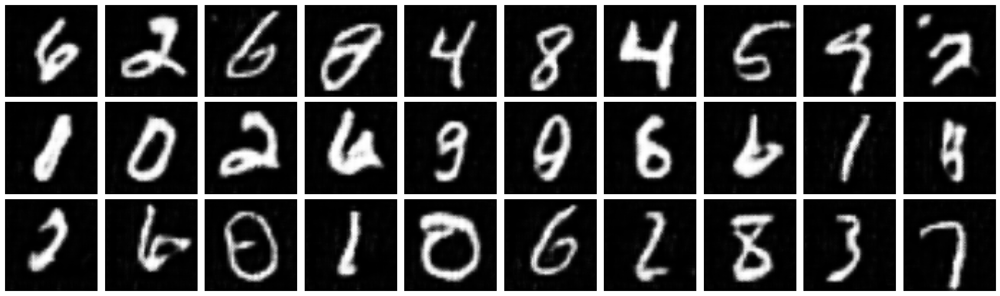


Epoch 15/20
----------
Batch 1/469: Generator Loss: 1.8320, Discriminator Loss: 0.2581
Batch 101/469: Generator Loss: 2.8856, Discriminator Loss: 0.2014
Batch 201/469: Generator Loss: 2.5955, Discriminator Loss: 0.1702
Batch 301/469: Generator Loss: 3.7601, Discriminator Loss: 0.0623
Batch 401/469: Generator Loss: 3.6905, Discriminator Loss: 0.1069
----------
Epoch 15/20: Generator Loss: 3.0204, Discriminator Loss: 0.2396, Time taken: 0:03:53.473081


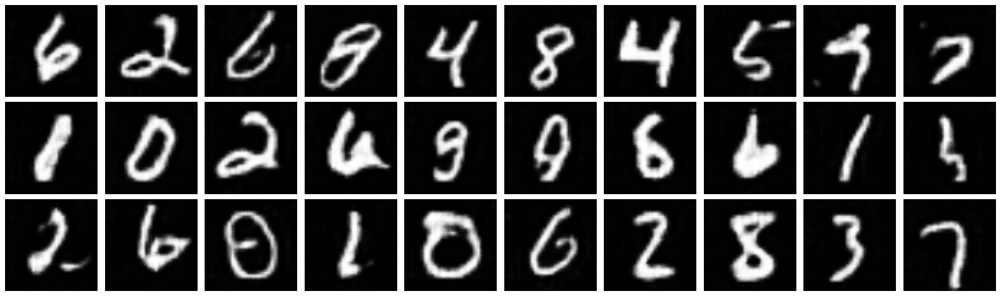


Epoch 16/20
----------
Batch 1/469: Generator Loss: 3.5933, Discriminator Loss: 0.0627
Batch 101/469: Generator Loss: 4.8315, Discriminator Loss: 0.0134
Batch 201/469: Generator Loss: 4.8922, Discriminator Loss: 0.0100
Batch 301/469: Generator Loss: 5.3900, Discriminator Loss: 0.0086
Batch 401/469: Generator Loss: 5.6406, Discriminator Loss: 0.0051
----------
Epoch 16/20: Generator Loss: 5.0400, Discriminator Loss: 0.0153, Time taken: 0:03:53.390744


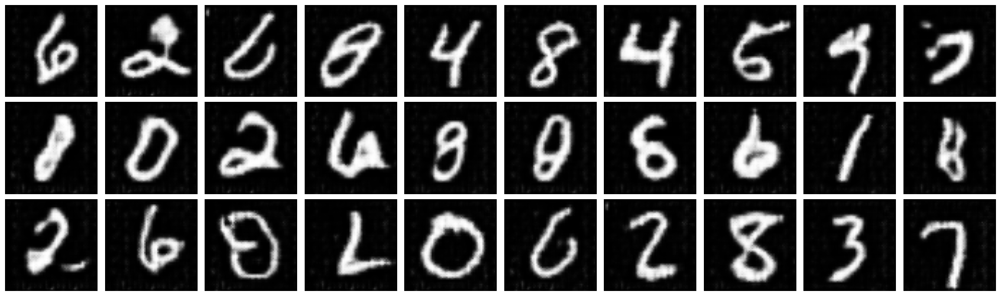


Epoch 17/20
----------
Batch 1/469: Generator Loss: 5.9411, Discriminator Loss: 0.0074
Batch 101/469: Generator Loss: 5.5272, Discriminator Loss: 0.0049
Batch 201/469: Generator Loss: 6.5502, Discriminator Loss: 0.0061
Batch 301/469: Generator Loss: 2.7133, Discriminator Loss: 0.1105
Batch 401/469: Generator Loss: 3.2359, Discriminator Loss: 0.0749
----------
Epoch 17/20: Generator Loss: 4.5791, Discriminator Loss: 0.1290, Time taken: 0:03:54.304063


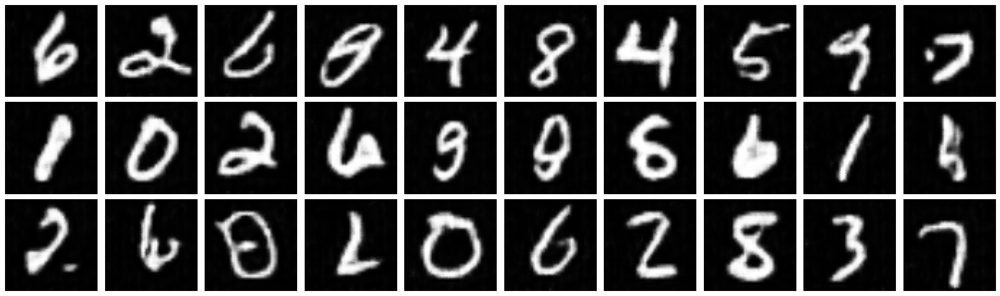


Epoch 18/20
----------
Batch 1/469: Generator Loss: 3.1621, Discriminator Loss: 0.1255
Batch 101/469: Generator Loss: 3.4802, Discriminator Loss: 0.1480
Batch 201/469: Generator Loss: 3.2466, Discriminator Loss: 0.1272
Batch 301/469: Generator Loss: 4.1147, Discriminator Loss: 0.0228
Batch 401/469: Generator Loss: 3.9189, Discriminator Loss: 0.0966
----------
Epoch 18/20: Generator Loss: 3.6637, Discriminator Loss: 0.1425, Time taken: 0:03:53.612908


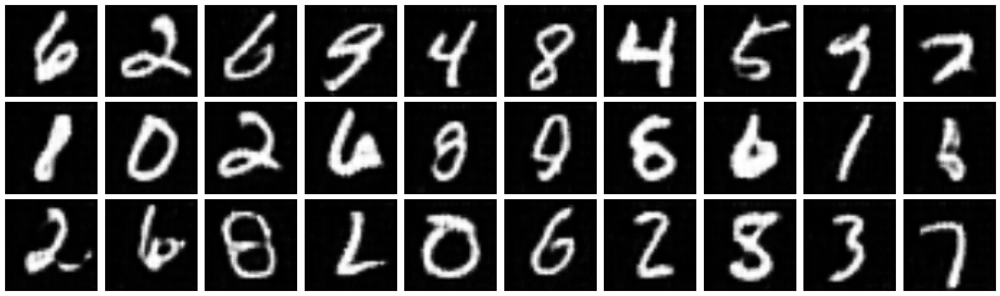


Epoch 19/20
----------
Batch 1/469: Generator Loss: 4.9412, Discriminator Loss: 0.0172
Batch 101/469: Generator Loss: 5.3948, Discriminator Loss: 0.0173
Batch 201/469: Generator Loss: 3.5024, Discriminator Loss: 0.0751
Batch 301/469: Generator Loss: 2.5728, Discriminator Loss: 0.1364
Batch 401/469: Generator Loss: 3.7869, Discriminator Loss: 0.0295
----------
Epoch 19/20: Generator Loss: 3.9788, Discriminator Loss: 0.1374, Time taken: 0:03:58.118384


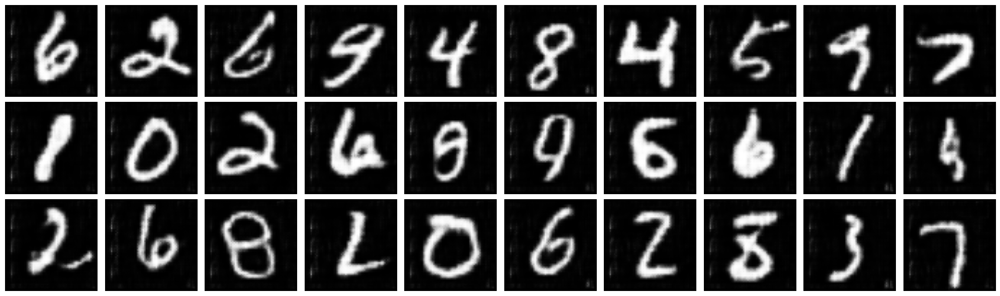


Epoch 20/20
----------
Batch 1/469: Generator Loss: 5.7193, Discriminator Loss: 0.0183
Batch 101/469: Generator Loss: 2.9126, Discriminator Loss: 0.1135
Batch 201/469: Generator Loss: 3.4515, Discriminator Loss: 0.0573
Batch 301/469: Generator Loss: 4.0730, Discriminator Loss: 0.0263
Batch 401/469: Generator Loss: 5.3782, Discriminator Loss: 0.0068
----------
Epoch 20/20: Generator Loss: 4.3016, Discriminator Loss: 0.1070, Time taken: 0:03:56.205531


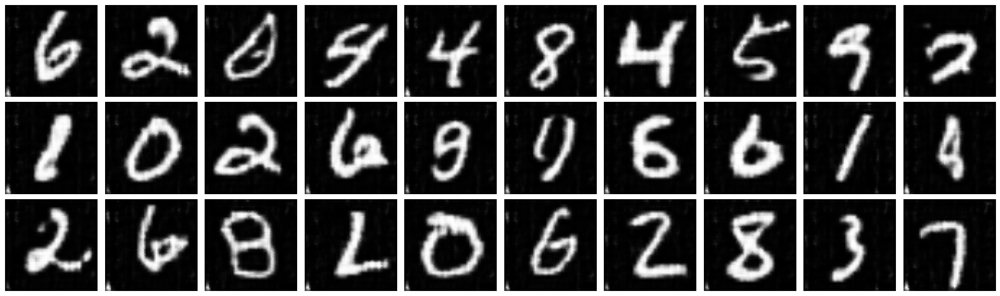

In [11]:
import time
from datetime import timedelta

epochs = 20

num_batches = len(loader)
gen_losses_avg, disc_losses_avg = [], []
fix_latent_vector = torch.randn(30, latent_dim, 1, 1).to(device)
for epoch in range(epochs):
    gen.train(), disc.train()

    print("\n" + f"Epoch {epoch + 1 }/{epochs}" + "\n" + "-" * 10)
    start_time = time.time()

    running_gen_loss, running_disc_loss = 0.0, 0.0
    for batch_idx, (real_images, class_labels) in enumerate(loader, start=0):
        real_images = real_images.to(device)

        noise = torch.randn(loader.batch_size, latent_dim, 1, 1).to(device)
        fake_images = gen(noise)

        # 1. Discriminator training: minimize - log(D(x)) - log(1 - D(G(z))).
        real_output = disc(real_images).reshape(-1)
        fake_output = disc(fake_images).reshape(-1)

        real_loss = loss(real_output, torch.ones_like(real_output))
        fake_loss = loss(fake_output, torch.zeros_like(fake_output))

        disc_loss = (real_loss + fake_loss) / 2

        optim_disc.zero_grad()
        disc_loss.backward(retain_graph=True)
        optim_disc.step()

        # 2. Generator training: minimize - log(D(G(z))).
        fake_output = disc(fake_images).reshape(-1)
        gen_loss = loss(fake_output, torch.ones_like(fake_output))

        optim_gen.zero_grad()
        gen_loss.backward()
        optim_gen.step()

        if batch_idx % 100 == 0:
            print(f"Batch {batch_idx + 1}/{num_batches}: "
                  f"Generator Loss: {gen_loss.item():.4f}, "
                  f"Discriminator Loss: {disc_loss.item():.4f}")

        running_gen_loss += gen_loss.item()
        running_disc_loss += disc_loss.item()

    gen_losses_avg.append(running_gen_loss / num_batches)
    disc_losses_avg.append(running_disc_loss / num_batches)
    end_time = time.time()

    print("-" * 10 + "\n" + f"Epoch {epoch + 1}/{epochs}: "
          f"Generator Loss: {gen_losses_avg[-1]:.4f}, "
          f"Discriminator Loss: {disc_losses_avg[-1]:.4f}, "
          f"Time taken: {timedelta(seconds=end_time - start_time)}")

    gen.eval(), disc.eval()
    fake_images = gen(fix_latent_vector).detach().cpu().numpy()

    fig, axs = plt.subplots(3, 10, figsize=(20, 6))
    for i, ax in enumerate(axs.ravel()):
        ax.imshow(fake_images[i][0], cmap="gray")
        ax.axis("off")
    plt.tight_layout()
    plt.show()
    plt.close(fig)

## Plotting the Training Losses

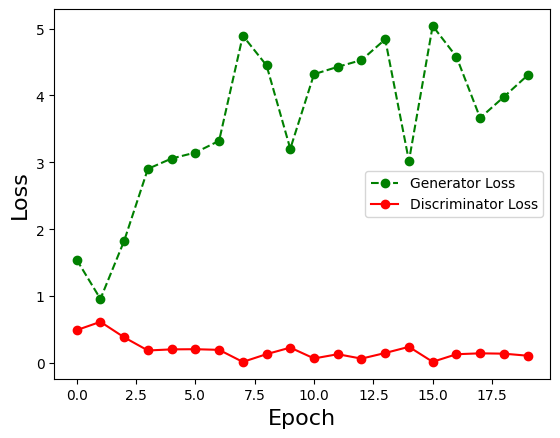

In [12]:
import numpy as np

plt.plot(np.arange(len(gen_losses_avg)), gen_losses_avg, "g--o",
         label="Generator Loss")
plt.plot(np.arange(len(disc_losses_avg)), disc_losses_avg, "r-o",
         label="Discriminator Loss")
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Loss", fontsize=16)
plt.legend()
plt.show()